# Compare SWE Reanalysis to ASO:

In [1]:
import pandas as pd
import numpy as np
import rioxarray as rxr
import xarray as xr
import matplotlib.pyplot as plt
import altair as alt
import geopandas as gpd
import pickle
import rasterio as rio
import altair as alt
import pickle
import os
from sklearn.metrics import mean_squared_error

In [2]:
import datetime

def day_of_year(date):
    # Check if it's a leap year
    leap_year = date.year % 4 == 0 and (date.year % 100 != 0 or date.year % 400 == 0)
    
    # Define days in each month, accounting for leap year
    days_in_month = [31, 29 if leap_year else 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
    
    # Calculate day of the year
    day_count = sum(days_in_month[i] for i in range(date.month - 1)) + date.day
    
    return day_count

# Example usage
date = datetime.date(2024, 5, 9)
print("Day of the year:", day_of_year(date))


Day of the year: 130


In [3]:
def subset_reanalysis(ds_fn, date, out_fn):
    # read in and format large SWE Reanalysis file:
    
    ds = xr.open_dataset(ds_fn)
    ds.rio.write_crs('EPSG:4326',inplace = True)
    if 'Latitude' in ds.dims:
        ds = ds.rename({'Latitude':'y','Longitude':'x'})
    
    ds = ds.rio.set_spatial_dims('y','x',inplace=True)

    # Subset to the correct day and statistic, and read out as a new file:
    ds_day = ds.sel({'Stats': 2,'Day': day_of_year(date)})
    ds_day = ds_day.SWE_Post.T
    ds_day.to_netcdf(out_fn)
    
    return ds_day

In [4]:
def calculate_difference(lidar_fn, aso_poly_fn, nc_fn, out_fn):

    # Load in the data:
    aso = rxr.open_rasterio(lidar_fn, mask_and_scale=True).squeeze()
    aso_poly = gpd.read_file(aso_poly_fn)
    ds = xr.open_dataarray(nc_fn)
    
    # clip the reanalysis data:
    ds_clip = ds.rio.clip(aso_poly.to_crs('epsg:4326').geometry)
    
    # reproject and match the resolution of the ASO data to that of the reanalysis:
    aso_match = aso.rio.reproject_match(ds_clip, resampling = rio.enums.Resampling.cubic)

    # Calculate the difference between ASO and Reanalysis:
    aso_re_dif = ds_clip - aso_match

    # Save the difference tif:
    aso_re_dif.rio.to_raster(out_fn)

    # Calculate statistics: 
    # r = np.corrcoef(aso_match.values, ds_clip.values)
    # md = aso_re_dif.mean()
    # rmse = np.sqrt(((ds_clip.values - aso_match.values) ** 2).mean())

    # Plot the difference:
    fig, ax = plt.subplots()
    aso_re_dif.plot(cmap='RdBu')

    return aso_re_dif #, r, md, rmse

In [ ]:
def calculate_stats(lidar_fn, nc_fn, dif_fn):
    aso = 
    r = 

### Test the code:

In [5]:
ds_fn = '../data/reanalysis/aso_dates/WUS_UCLA_SR_v01_N37_0W107_0_agg_16_WY2014_15_SWE_SCA_POST.nc'
out_fn = '../data/reanalysis/aso_dates_processed/swe_reanalysis_SWE_Post_2016_04_03.nc'
date = datetime.date(2016, 4, 3)
ds_day1 = subset_reanalysis(ds_fn, date, out_fn)

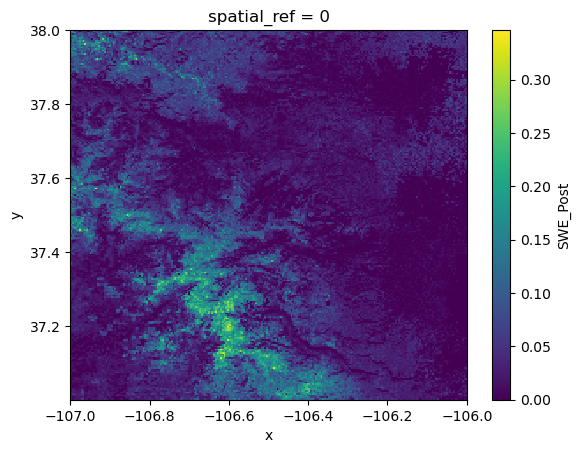

In [6]:
ds_day1.plot()

### Combine tiles for the East River:

In [6]:
# er_38_107_2018 = xr.open_dataset('../data/reanalysis/aso_dates/individual_tiles/WUS_UCLA_SR_v01_N38_0W107_0_agg_16_WY2017_18_SWE_SCA_POST.nc')
# er_38_107_2019 = xr.open_dataset('../data/reanalysis/aso_dates/individual_tiles/WUS_UCLA_SR_v01_N38_0W107_0_agg_16_WY2018_19_SWE_SCA_POST.nc')

# er_38_108_2018 = xr.open_dataset('../data/reanalysis/aso_dates/individual_tiles/WUS_UCLA_SR_v01_N38_0W108_0_agg_16_WY2017_18_SWE_SCA_POST.nc')
# er_38_108_2019 = xr.open_dataset('../data/reanalysis/aso_dates/individual_tiles/WUS_UCLA_SR_v01_N38_0W108_0_agg_16_WY2018_19_SWE_SCA_POST.nc')

# er_39_107_2018 = xr.open_dataset('../data/reanalysis/aso_dates/individual_tiles/WUS_UCLA_SR_v01_N39_0W107_0_agg_16_WY2017_18_SWE_SCA_POST.nc')
# er_39_107_2019 = xr.open_dataset('../data/reanalysis/aso_dates/individual_tiles/WUS_UCLA_SR_v01_N39_0W107_0_agg_16_WY2018_19_SWE_SCA_POST.nc')

# er_39_108_2018 = xr.open_dataset('../data/reanalysis/aso_dates/individual_tiles/WUS_UCLA_SR_v01_N39_0W108_0_agg_16_WY2017_18_SWE_SCA_POST.nc')
# er_39_108_2019 = xr.open_dataset('../data/reanalysis/aso_dates/individual_tiles/WUS_UCLA_SR_v01_N39_0W108_0_agg_16_WY2018_19_SWE_SCA_POST.nc')

In [17]:
# er_2018 = xr.combine_by_coords([er_38_107_2018, er_38_108_2018, er_39_107_2018, er_39_108_2018])

In [7]:
# er_2019 = xr.combine_by_coords([er_38_107_2019, er_38_108_2019, er_39_107_2019, er_39_108_2019])

In [9]:
# date = datetime.date(2019, 4, 7)

### Check that tiles cover the whole watershed:

In [10]:
# er_2019.rio.write_crs('EPSG:4326',inplace = True)
# er_2019 = er_2019.rename({'Latitude':'y','Longitude':'x'})
# er_2019 = er_2019.rio.set_spatial_dims('y','x',inplace=True)

# # Subset to the correct day and statistic, and read out as a new file:
# ds_day = er_2019.sel({'Stats': 2,'Day': day_of_year(date)})
# ds_day = ds_day.SWE_Post.T

In [12]:
aso_poly = gpd.read_file('../data/misc/east_river_outline.geojson')

<Axes: title={'center': 'spatial_ref = 0'}, xlabel='x', ylabel='y'>

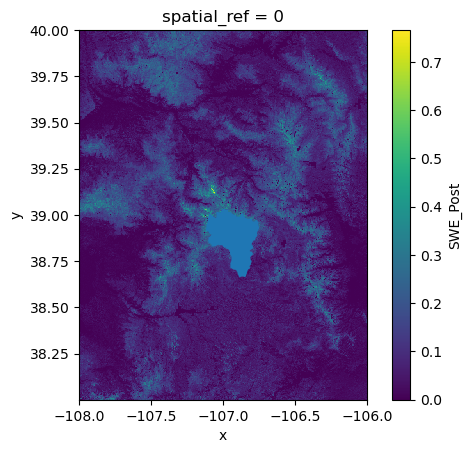

In [13]:
# fig, ax = plt.subplots()
# ds_day.plot(ax=ax)
# aso_poly.to_crs('epsg:4326').plot(ax=ax)

In [18]:
# er_2018.to_netcdf('../data/reanalysis/aso_dates/WUS_UCLA_SR_v01_N3839_0W107108_0_agg_16_WY2017_18_SWE_SCA_Post.nc')

In [15]:
# er_2019.to_netcdf('../data/reanalysis/aso_dates/WUS_UCLA_SR_v01_N3839_0W107108_0_agg_16_WY2018_19_SWE_SCA_Post.nc')

### Scale up to all the reanalysis data for comparison to ASO:

#### Prep the file path names:

In [8]:
import datetime

In [9]:
home_dir = '../data/reanalysis/aso_dates/'
dir_lst = os.listdir(home_dir)
ds_fns = [home_dir + x for x in dir_lst if ".nc" in x]
ds_fns.sort()

out_home = '../data/reanalysis/aso_dates_processed/'
dates = [datetime.date(2015, 4, 6), datetime.date(2016, 4, 3), datetime.date(2018, 3, 31), datetime.date(2019, 4, 7)]

out_fns = []
for fn, date in zip(ds_fns, dates):
    out_fns.append(out_home + 'SWE_Post' + '_' + fn.split('/')[-1].split('_')[4] + '_' + fn.split('/')[-1].split('_')[5] + '_'+ f'{date.year}' + '_' + f'{date.month}' + '_' + f'{date.day}' + '.nc')

In [35]:
test_poly = gpd.read_file('../data/misc/east_river_4326.geojson')

<Axes: >

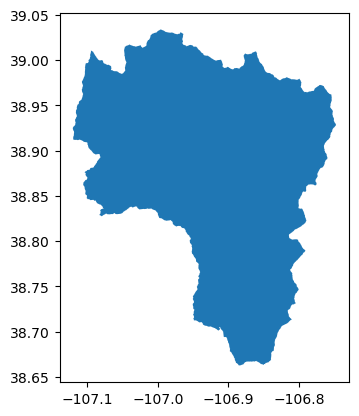

In [36]:
test_poly.plot()

#### Output the subsetted files:

In [28]:
for ds_fn, date, out_fn in zip(ds_fns, dates, out_fns):
    subset_reanalysis(ds_fn, date, out_fn)

#### Calculate the difference from ASO:

In [3]:
home_dir = '../data/aso_lidar/comparison_lidar/'
dir_lst = os.listdir(home_dir)
tif_fns = [home_dir + x for x in dir_lst if ".tif" in x]
tif_fns.sort()

out_home = '../data/reanalysis_aso_dif/'
out_tif_fns = []
for fn in tif_fns:
    out_tif_fns.append(out_home + 'swe_reanalysis_aso_difference' + '_' + fn.split('/')[-1].split('_')[3] + '_' + fn.split('/')[-1].split('_')[4] + '.tif')

poly_fn_list = ['../data/misc/conejos_outline.geojson', '../data/misc/conejos_outline.geojson', '../data/misc/east_river_outline.geojson', '../data/misc/east_river_outline.geojson']

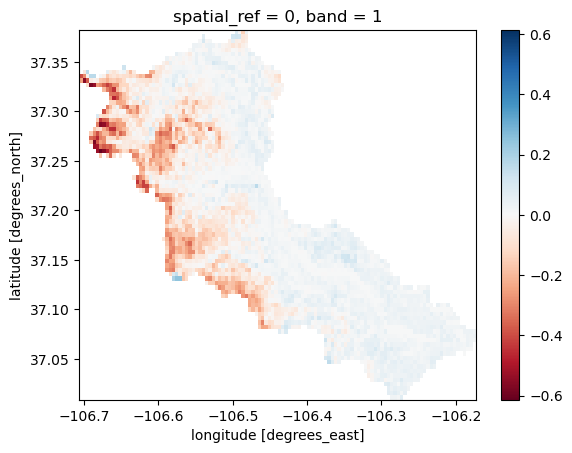

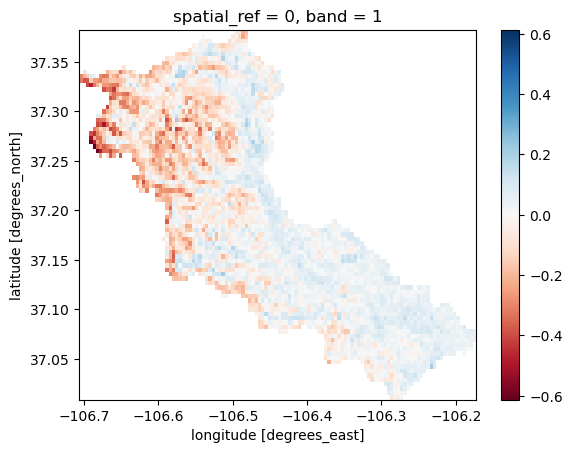

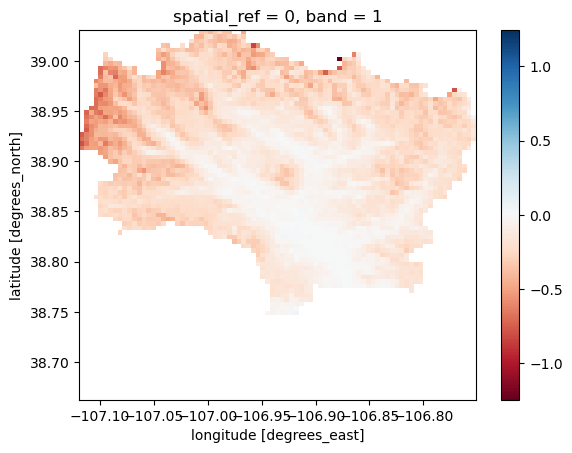

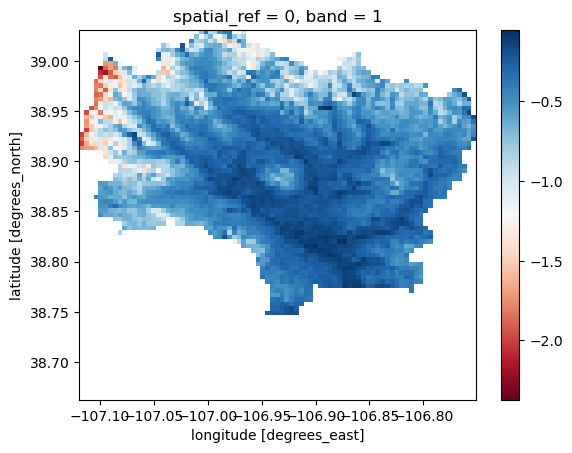

In [420]:
for lidar, poly, nc_fn, out_fn in zip(tif_fns, poly_fn_list, out_fns, out_tif_fns):
    calculate_difference(lidar, poly, nc_fn, out_fn)

### Check my work:

In [31]:
dates

[datetime.date(2015, 4, 6),
 datetime.date(2016, 4, 3),
 datetime.date(2018, 3, 31),
 datetime.date(2019, 4, 7)]

In [35]:
print(dates[0])
day_of_year(dates[0])

2015-04-06


96

In [34]:
print(dates[1])
day_of_year(dates[1])

2016-04-03


94

In [33]:
print(dates[2])
day_of_year(dates[2])

2018-03-31


90

In [36]:
print(dates[3])
day_of_year(dates[3])

2019-04-07


97

### Read in the files and plot them with the polygon to make sure they transformed ok:

### 2015:

In [19]:
tif_fns[0]

'../data/aso_lidar/comparison_lidar/ASO_50M_SWE_USCOCJ_20150406.tif'

In [52]:
aso = rxr.open_rasterio(tif_fns[0], mask_and_scale=True).squeeze()
aso_poly = gpd.read_file(poly_fn_list[0])
ds = xr.open_dataarray(out_fns[0])
dif = rxr.open_rasterio(out_tif_fns[0], mask_and_scale=True).squeeze()

In [53]:
# Calculate statistics: 
ds_clip = ds.rio.clip(aso_poly.to_crs('epsg:4326').geometry)
aso_match = aso.rio.reproject_match(ds_clip, resampling = rio.enums.Resampling.cubic)

r = np.corrcoef(aso_match.values[ds_clip.notnull() & aso_match.notnull()].flatten(), ds_clip.values[ds_clip.notnull() & aso_match.notnull()])[0,1]
md = dif.values[dif.notnull()].mean()
rmse = np.sqrt(((ds_clip.values[ds_clip.notnull()] - aso_match.values[ds_clip.notnull()].flatten()) ** 2).mean())
print('Conejos 2015:')
print('R = ', r)
print('MD = ', md)
print('RMSE = ', rmse)

Conejos 2015:
R =  0.8289404706863319
MD =  -0.028810605
RMSE =  0.101103894


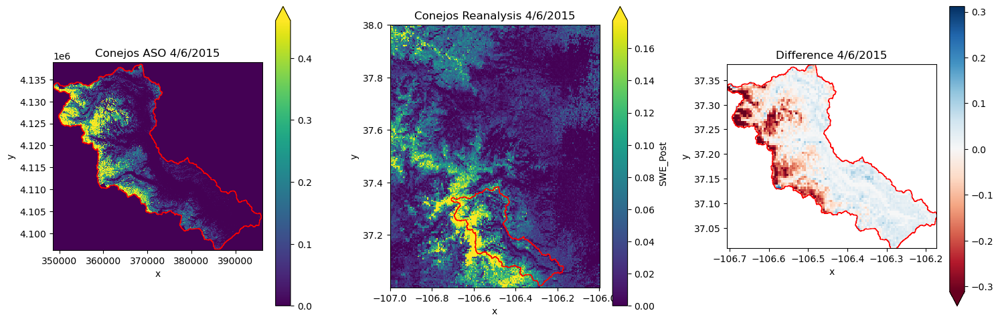

In [54]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

aso.plot(ax=ax[0],robust=True)
aso_poly.plot(ax=ax[0], facecolor='none', edgecolor='red')
ax[0].set_title('Conejos ASO 4/6/2015')

ds.plot(ax=ax[1],robust=True)
aso_poly.to_crs('epsg:4326').plot(ax=ax[1], facecolor='none', edgecolor='red')
ax[1].set_title('Conejos Reanalysis 4/6/2015')

dif.plot(ax=ax[2],robust=True, cmap='RdBu')
aso_poly.to_crs('epsg:4326').plot(ax=ax[2], facecolor='none', edgecolor='red')
ax[2].set_title('Difference 4/6/2015')
plt.tight_layout()
plt.savefig('../figures/conejos_aso_dif.png')

### 2016:

In [28]:
tif_fns[1]

'../data/aso_lidar/comparison_lidar/ASO_50M_SWE_USCOCJ_20160403.tif'

In [55]:
aso = rxr.open_rasterio(tif_fns[1], mask_and_scale=True).squeeze()
aso_poly = gpd.read_file(poly_fn_list[1])
ds = xr.open_dataarray(out_fns[1])
dif = rxr.open_rasterio(out_tif_fns[1], mask_and_scale=True).squeeze()

In [56]:
# Calculate statistics: 
ds_clip = ds.rio.clip(aso_poly.to_crs('epsg:4326').geometry)
aso_match = aso.rio.reproject_match(ds_clip, resampling = rio.enums.Resampling.cubic)

r = np.corrcoef(aso_match.values[ds_clip.notnull() & aso_match.notnull()].flatten(), ds_clip.values[ds_clip.notnull() & aso_match.notnull()])[0,1]
md = dif.values[dif.notnull()].mean()
rmse = np.sqrt(((ds_clip.values[ds_clip.notnull() & aso_match.notnull()] - aso_match.values[ds_clip.notnull() & aso_match.notnull()].flatten()) ** 2).mean())
print('Conejos 2016:')
print('R = ', r)
print('MD = ', md)
print('RMSE = ', rmse)

Conejos 2016:
R =  0.8533083686162619
MD =  -0.027528627
RMSE =  0.111129515


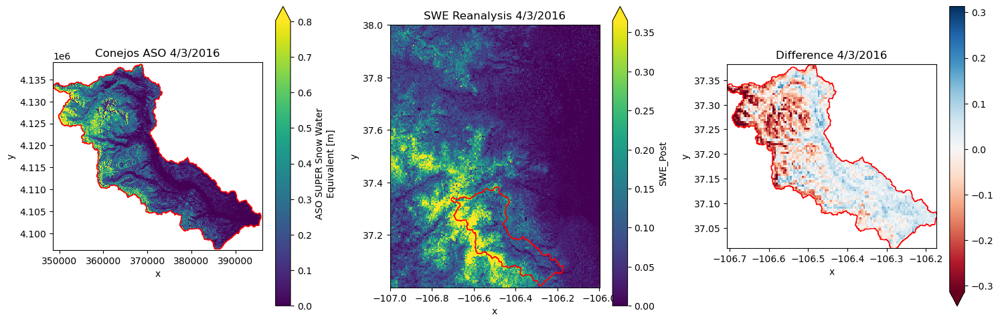

In [57]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

aso.plot(ax=ax[0], robust=True)
aso_poly.plot(ax=ax[0], facecolor='none', edgecolor='red')
ax[0].set_title('Conejos ASO 4/3/2016')

ds.plot(ax=ax[1], robust=True)
aso_poly.to_crs('epsg:4326').plot(ax=ax[1], facecolor='none', edgecolor='red')
ax[1].set_title('SWE Reanalysis 4/3/2016')

dif.plot(ax=ax[2], robust=True, cmap='RdBu')
aso_poly.to_crs('epsg:4326').plot(ax=ax[2], facecolor='none', edgecolor='red')
ax[2].set_title('Difference 4/3/2016')

plt.tight_layout()
plt.savefig('../figures/conejos_aso_dif_2016.png')

### 2018:

In [31]:
tif_fns[2]

'../data/aso_lidar/comparison_lidar/ASO_50M_SWE_USCOGE_20180331_clipped.tif'

In [58]:
aso = rxr.open_rasterio(tif_fns[2], mask_and_scale=True).squeeze()
aso_poly = gpd.read_file(poly_fn_list[2])
ds = xr.open_dataarray(out_fns[2])
dif = rxr.open_rasterio(out_tif_fns[2], mask_and_scale=True).squeeze()

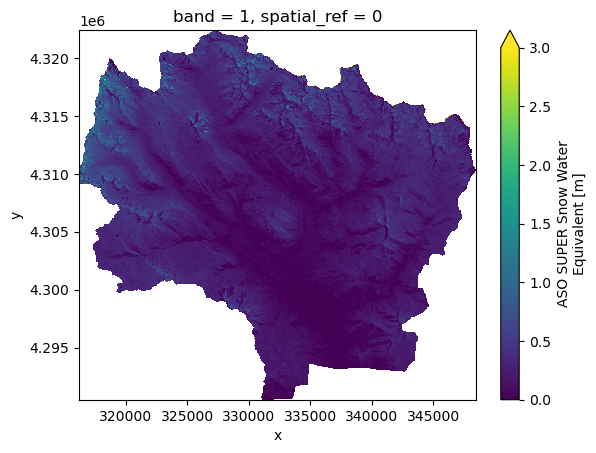

In [33]:
aso.plot(vmin=0, vmax=3)

In [37]:
aso_poly_clip = gpd.read_file('../data/misc/east_river_clipped.geojson')

In [59]:
# Calculate statistics: 
ds_clip = ds.rio.clip(aso_poly_clip.to_crs('epsg:4326').geometry)
aso_match = aso.rio.reproject_match(ds_clip, resampling = rio.enums.Resampling.cubic)

r = np.corrcoef(aso_match.values[ds_clip.notnull() & aso_match.notnull()].flatten(), ds_clip.values[ds_clip.notnull() & aso_match.notnull()])[0,1]
md = dif.values[dif.notnull()].mean()
rmse = np.sqrt(((ds_clip.values[ds_clip.notnull() & aso_match.notnull()] - aso_match.values[ds_clip.notnull() & aso_match.notnull()].flatten()) ** 2).mean())
print('East River 2018')
print('R = ', r)
print('MD = ', md)
print('RMSE = ', rmse)

East River 2018
R =  0.7406845009006863
MD =  -0.1970797
RMSE =  0.24119626


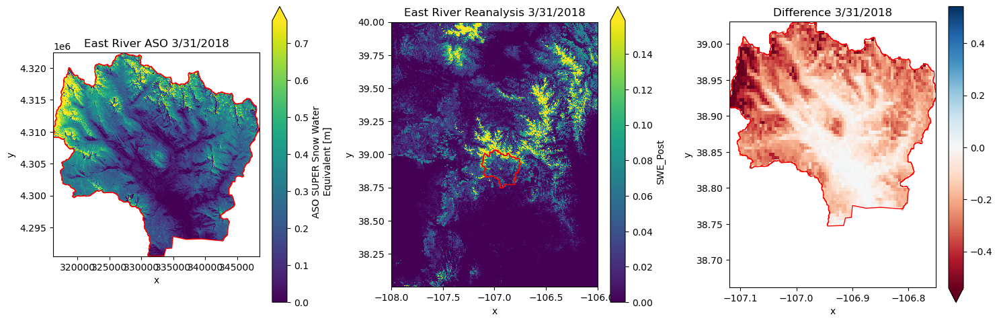

In [60]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

aso.plot(ax=ax[0], robust=True)
aso_poly_clip.plot(ax=ax[0], facecolor='none', edgecolor='red')
ax[0].set_title('East River ASO 3/31/2018')

ds.plot(ax=ax[1], robust=True)
aso_poly_clip.to_crs('epsg:4326').plot(ax=ax[1], facecolor='none', edgecolor='red')
ax[1].set_title('East River Reanalysis 3/31/2018')

dif.plot(ax=ax[2], robust=True, cmap='RdBu')
aso_poly_clip.to_crs('epsg:4326').plot(ax=ax[2], facecolor='none', edgecolor='red')
ax[2].set_title('Difference 3/31/2018')

plt.tight_layout()
plt.savefig('../figures/eastriver_aso_dif_2018.png')

### 2019:

- ~~Email Jeff Deems about this, be respectful, ask if maybe NSIDC doesn't have the best dataset.~~
- could leave this year out, or say this year was hard to get - ASO could have had a weird flight, but reanalysis could be wrong if it was cloudy at the snow disappeared. Danny might have guesses about this in the spring in the East River (where is it cloudy) - could look at snow disappearance from the snotel and then see if there's precip around this time. And ask Danny about incoming solar and precip.   
- Could look at correlation space instead of distance for pulling snotel stations for the interactive plotting.  

  - David has icesat2 money so Jessica suggests having him as an advisor for chapters 2-3.  
  - End of July is the earliest that I wouldn't have funding. I have my RA through the summer - and would ask Rachel to handle the field work.

In [45]:
tif_fns[3]

'../data/aso_lidar/comparison_lidar/ASO_50M_SWE_USCOGE_20190407_clipped.tif'

In [61]:
aso = rxr.open_rasterio(tif_fns[3], mask_and_scale=True).squeeze()
aso_poly = gpd.read_file(poly_fn_list[3])
ds = xr.open_dataarray(out_fns[3])
dif = rxr.open_rasterio(out_tif_fns[3], mask_and_scale=True).squeeze()

In [12]:
aso = rxr.open_rasterio('../data/aso_lidar/east_river_lidar/ASO_50M_SWE_USCOGE_20190407.tif', mask_and_scale=True).squeeze()

<Axes: title={'center': 'band = 1, spatial_ref = 0'}, xlabel='x', ylabel='y'>

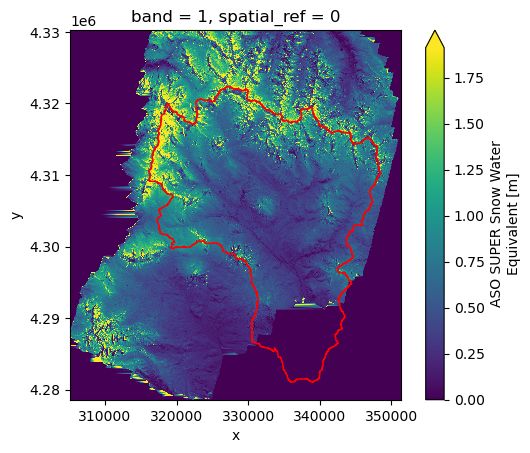

In [14]:
fig, ax = plt.subplots()
aso.plot(ax=ax, robust=True)
aso_poly.plot(ax=ax, facecolor='none',edgecolor='red')

In [62]:
# Calculate statistics: 
ds_clip = ds.rio.clip(aso_poly_clip.to_crs('epsg:4326').geometry)
aso_match = aso.rio.reproject_match(ds_clip, resampling = rio.enums.Resampling.cubic)

r = np.corrcoef(aso_match.values[ds_clip.notnull() & aso_match.notnull()].flatten(), ds_clip.values[ds_clip.notnull() & aso_match.notnull()])[0,1]
md = dif.values[dif.notnull()].mean()
rmse = np.sqrt(((ds_clip.values[ds_clip.notnull() & aso_match.notnull()] - aso_match.values[ds_clip.notnull() & aso_match.notnull()].flatten()) ** 2).mean())
print('East River 2019:')
print('R = ', r)
print('MD = ', md)
print('RMSE = ', rmse)

East River 2019:
R =  0.8004439215299061
MD =  -0.5032023
RMSE =  0.5899563


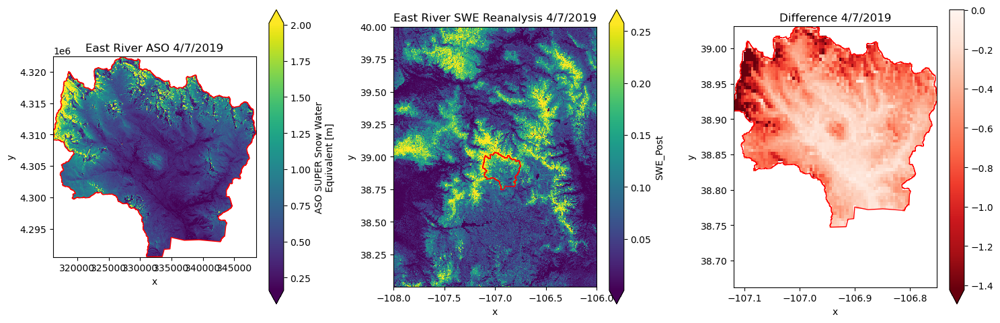

In [67]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

aso.plot(ax=ax[0], robust=True)
aso_poly_clip.plot(ax=ax[0], facecolor='none', edgecolor='red')
ax[0].set_title('East River ASO 4/7/2019')

ds.plot(ax=ax[1], robust=True)
aso_poly_clip.to_crs('epsg:4326').plot(ax=ax[1], facecolor='none', edgecolor='red')
ax[1].set_title('East River SWE Reanalysis 4/7/2019')

dif.plot(ax=ax[2], robust=True, cmap='Reds_r',vmax=0)
aso_poly_clip.to_crs('epsg:4326').plot(ax=ax[2], facecolor='none', edgecolor='red')
ax[2].set_title('Difference 4/7/2019')

plt.tight_layout()
plt.savefig('../figures/eastriver_aso_dif_2019.png')

<Axes: title={'center': 'ASO - SWE Reanalysis  difference'}, xlabel='x', ylabel='y'>

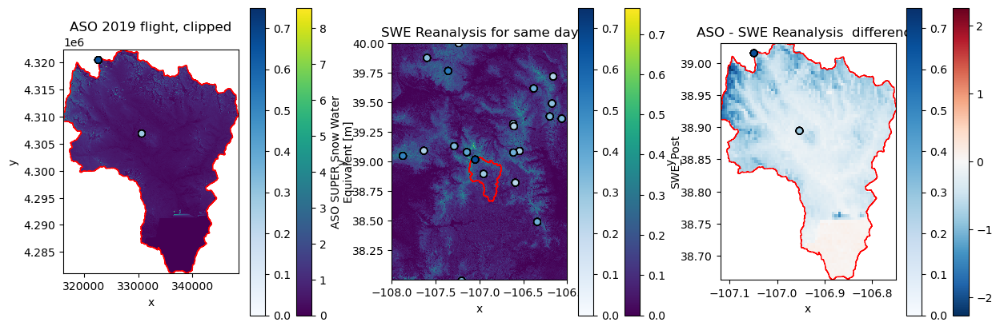

In [95]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

aso.plot(ax=ax[0])
aso_poly.plot(ax=ax[0], facecolor='none', edgecolor='red')
ax[0].set_title('ASO 2019 flight, clipped')
snotel.to_crs('epsg:32613').plot(ax=ax[0], column='station_swe', edgecolor='k', legend=True, cmap='Blues',vmin=0,vmax=0.75)

ds.plot(ax=ax[1])
aso_poly.to_crs('epsg:4326').plot(ax=ax[1], facecolor='none', edgecolor='red')
ax[1].set_title('SWE Reanalysis for same day')
snotel.plot(ax=ax[1], column='station_swe', edgecolor='k', legend=True, cmap='Blues',vmin=0,vmax=0.75)

dif.plot(ax=ax[2])
aso_poly.to_crs('epsg:4326').plot(ax=ax[2], facecolor='none', edgecolor='red')
ax[2].set_title('ASO - SWE Reanalysis  difference')
snotel.plot(ax=ax[2], column='station_swe', edgecolor='k', legend=True, cmap='Blues',vmin=0,vmax=0.75)

<Axes: title={'center': 'ASO - SWE Reanalysis  difference'}, xlabel='x', ylabel='y'>

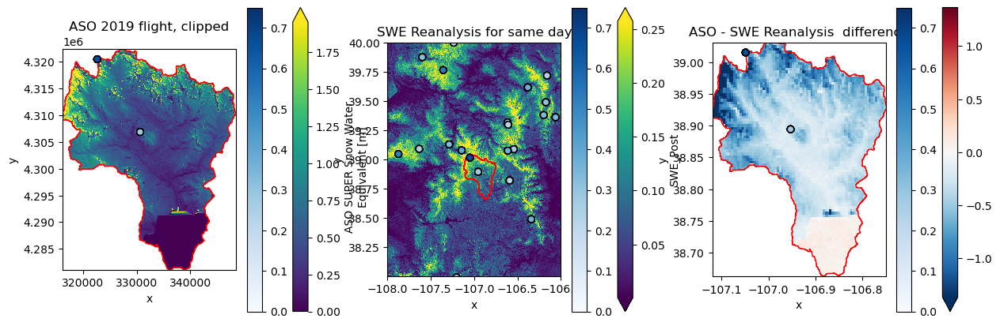

In [94]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

aso.plot(ax=ax[0], robust=True)
aso_poly.plot(ax=ax[0], facecolor='none', edgecolor='red')
ax[0].set_title('ASO 2019 flight, clipped')
snotel.to_crs('epsg:32613').plot(ax=ax[0], column='station_swe', edgecolor='k', legend=True, cmap='Blues',vmin=0,vmax=0.75)

ds.plot(ax=ax[1], robust=True)
aso_poly.to_crs('epsg:4326').plot(ax=ax[1], facecolor='none', edgecolor='red')
ax[1].set_title('SWE Reanalysis for same day')
snotel.plot(ax=ax[1], column='station_swe', edgecolor='k', legend=True, cmap='Blues',vmin=0,vmax=0.75)

dif.plot(ax=ax[2], robust=True)
aso_poly.to_crs('epsg:4326').plot(ax=ax[2], facecolor='none', edgecolor='red')
ax[2].set_title('ASO - SWE Reanalysis  difference')
snotel.plot(ax=ax[2], column='station_swe', edgecolor='k', legend=True, cmap='Blues',vmin=0,vmax=0.75)

In [67]:
er_2019_aso = rxr.open_rasterio('../data/aso_lidar/east_river_lidar/ASO_50M_SWE_USCOGE_20190407.tif', mask_and_scale=True).squeeze()

Text(0.5, 1.0, 'ASO 2019 flight')

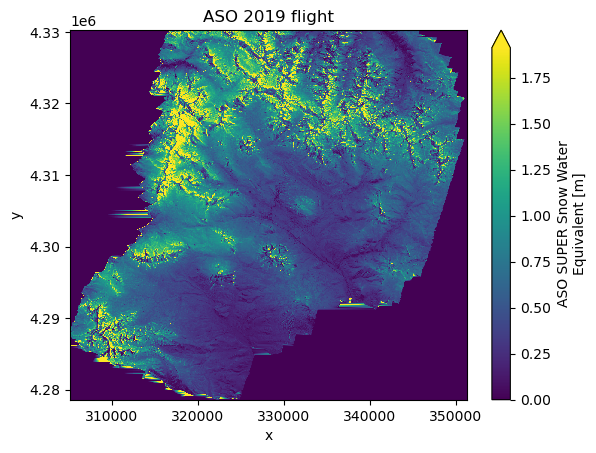

In [72]:
fig, ax = plt.subplots()
er_2019_aso.plot(robust=True)
plt.title('ASO 2019 flight')

In [79]:
snotel = pickle.load(open('../data/snv_dataframes/snv_temp_precip_gdf.pkl', 'rb'))

In [80]:
snotel

station_n  reanalysis_n  elevation_m  station_swe  \
station     year                                                      
301_CA_SNTL 1990  -0.492262     -0.194751  1886.712036     0.193040   
            1991  -0.806681      0.193222  1886.712036     0.142240   
            1992  -1.639892     -1.097426  1886.712036     0.007620   
            1993   0.938344     -0.578276  1886.712036     0.424180   
            1994  -0.335053     -0.422643  1886.712036     0.218440   
...                     ...           ...          ...          ...   
BLD         2017   0.619445      1.160298  2194.560000     1.033272   
            2018  -0.806206     -1.171988  2194.560000     0.371856   
            2019   0.501188      1.293572  2194.560000     0.978408   
            2020  -0.615681     -0.258835  2194.560000     0.460248   
            2021  -0.418586     -0.760679  2194.560000     0.551688   

                  station_swe_mean  reanalysis_swe  deg_days_0C  \
station     year                                                  
301_CA_SNTL 1990          0.272574          0.1718         57.0   
            1991          0.272574          0.2416         47.0   
            1992          0.272574          0.0094         64.0   
            1993          0.272574          0.1028         42.0   
            1994          0.272574          0.1308         48.0   
...                            ...             ...          ...   
BLD         2017          0.745887          1.1946         54.0   
            2018          0.745887          0.1796         82.0   
            2019          0.745887          1.2526         59.0   
            2020          0.745887          0.5770         68.0   
            2021          0.745887          0.3586         55.0   

                  cold_deg_days  cumulative_precip_m  precip_mean  ...  \
station     year                                                   ...   
301_CA_SNTL 1990            0.0             0.223842     0.332045  ...   
            1991            0.0             0.237158     0.332045  ...   
            1992            0.0             0.197154     0.332045  ...   
            1993            0.0             0.449491     0.332045  ...   
            1994            0.0             0.223718     0.332045  ...   
...                         ...                  ...          ...  ...   
BLD         2017            0.0             1.722192     0.846466  ...   
            2018            0.0             0.807857     0.846466  ...   
            2019            0.0             1.363057     0.846466  ...   
            2020            0.0             0.671916     0.846466  ...   
            2021            0.0             0.578816     0.846466  ...   

                  log_reanalysis_swe_mean  log_precip_std  \
station     year                                            
301_CA_SNTL 1990                     -inf        0.319384   
            1991                     -inf        0.319384   
            1992                     -inf        0.319384   
            1993                     -inf        0.319384   
            1994                     -inf        0.319384   
...                                   ...             ...   
BLD         2017                     -inf        0.376676   
            2018                     -inf        0.376676   
            2019                     -inf        0.376676   
            2020                     -inf        0.376676   
            2021                     -inf        0.376676   

                  log_station_swe_std  log_reanalysis_swe_std  log_precip_n  \
station     year                                                              
301_CA_SNTL 1990                  NaN                     NaN     -1.079449   
            1991                  NaN                     NaN     -0.898522   
            1992                  NaN                     NaN     -1.476953   
            1993                  NaN                     NaN      1.1

In [82]:
snotel.loc[pd.IndexSlice['380_CO_SNTL',2019],'station_swe']

0.48514

In [100]:
snotel.loc[pd.IndexSlice['380_CO_SNTL',2019],'reanalysis_swe']

0.6716

In [96]:
snotel.loc[pd.IndexSlice['380_CO_SNTL',2019],'station_swe'] - snotel.loc[pd.IndexSlice['380_CO_SNTL',2019],'reanalysis_swe']

-0.18645998416900633

In [109]:
x = snotel.to_crs('epsg:32613').loc[pd.IndexSlice['380_CO_SNTL',2019]].geometry.x
y = snotel.to_crs('epsg:32613').loc[pd.IndexSlice['380_CO_SNTL',2019]].geometry.y

In [119]:
x

330627.7811174394

In [116]:
with rio.open(tif_fns[3]):
    point = src.sample([(x,y)])
#src = rio.open(tif_fns[3])

In [106]:
#point = src.sample(x,y)

In [117]:
point

<generator object sample_gen at 0x1576675f0>

In [120]:
tif = rxr.open_rasterio(tif_fns[3])
point = tif.sel(x=x, y=y, method="nearest").values

In [121]:
point

array([0.38901934], dtype=float32)

In [142]:
x = snotel.to_crs('epsg:32613').loc[pd.IndexSlice['737_CO_SNTL',2019]].geometry.x
y = snotel.to_crs('epsg:32613').loc[pd.IndexSlice['737_CO_SNTL',2019]].geometry.y

In [143]:
tif = rxr.open_rasterio('../data/aso_lidar/east_river_lidar/ASO_50M_SWE_USCOGE_20190407.tif')
point2 = tif.sel(x=x, y=y, method="nearest").values

In [144]:
point2

array([0.9379465], dtype=float32)

In [146]:
snotel.loc[pd.IndexSlice['737_CO_SNTL',2019], 'station_swe']

1.19634

In [147]:
snotel.loc[pd.IndexSlice['737_CO_SNTL',2019], 'reanalysis_swe']

0.9872

<Axes: title={'center': 'band = 1, spatial_ref = 0'}, xlabel='x', ylabel='y'>

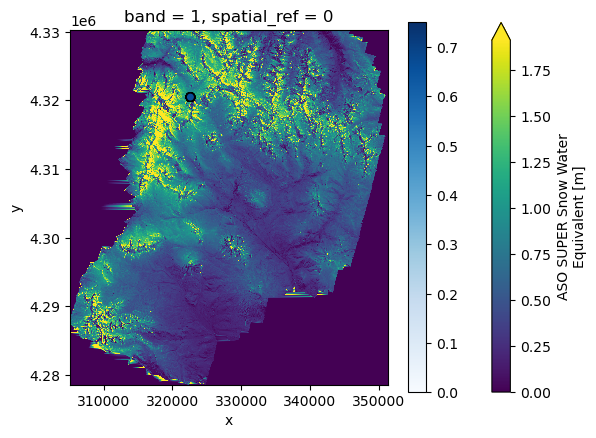

In [141]:
fig, ax = plt.subplots()
tif.plot(ax=ax,robust=True)
snotel[snotel.index.get_level_values(0)=='737_CO_SNTL'].to_crs('epsg:32613').plot(ax=ax, column='station_swe', edgecolor='k', legend=True, cmap='Blues',vmin=0,vmax=0.75)

In [148]:
snotel.expore()

type: 'GeoDataFrame' object has no attribute 'expore'

In [140]:
import plotly.express as px
import pandas as pd


# # Import data from USGS
# data = pd.read_csv('https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.csv')


# # Drop rows with missing or invalid values in the 'mag' column
# data = data.dropna(subset=['mag'])
# data = data[data.mag >= 0]


# Create scatter map
fig = px.scatter_geo(snotel, lat=snotel.geometry.y, lon=snotel.geometry.x, color='station_swe',
                     hover_name=snotel.index.get_level_values(0), #size='mag',
                     title='SNOTEL')
fig.show()

In [133]:
snotel.index.get_level_values

<bound method MultiIndex.get_level_values of MultiIndex([('301_CA_SNTL', 1990),
            ('301_CA_SNTL', 1991),
            ('301_CA_SNTL', 1992),
            ('301_CA_SNTL', 1993),
            ('301_CA_SNTL', 1994),
            ('301_CA_SNTL', 1995),
            ('301_CA_SNTL', 1996),
            ('301_CA_SNTL', 1997),
            ('301_CA_SNTL', 1998),
            ('301_CA_SNTL', 1999),
            ...
            (        'BLD', 2012),
            (        'BLD', 2013),
            (        'BLD', 2014),
            (        'BLD', 2015),
            (        'BLD', 2016),
            (        'BLD', 2017),
            (        'BLD', 2018),
            (        'BLD', 2019),
            (        'BLD', 2020),
            (        'BLD', 2021)],
           names=['station', 'year'], length=14240)>

In [102]:
aso_er = rxr.open_rasterio(out_tif_fns[3],masked=True)

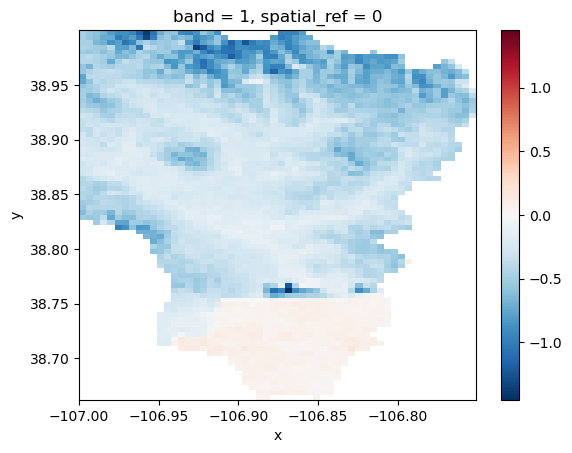

In [103]:
aso_er.plot()

In [105]:
aso_er_orig = rxr.open_rasterio('../data/aso_lidar/comparison_lidar/ASO_50M_SWE_USCOGE_20180331_clipped.tif', masked=True)

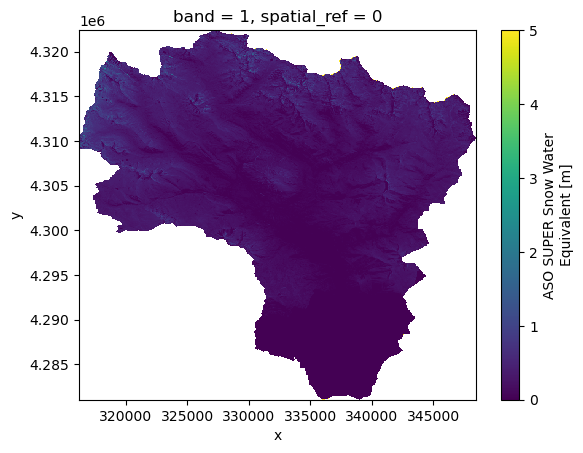

In [107]:
aso_er_orig.plot()

In [108]:
aso_poly = gpd.read_file('../data/misc/east_river_outline.geojson')

In [109]:
ds = xr.open_dataarray('../data/reanalysis/aso_dates_processed/SWE_Post_N38_0W107_2018_3_31.nc')
ds_clip = ds.rio.clip(aso_poly.to_crs('epsg:4326').geometry)

<Axes: title={'center': 'spatial_ref = 0'}, xlabel='x', ylabel='y'>

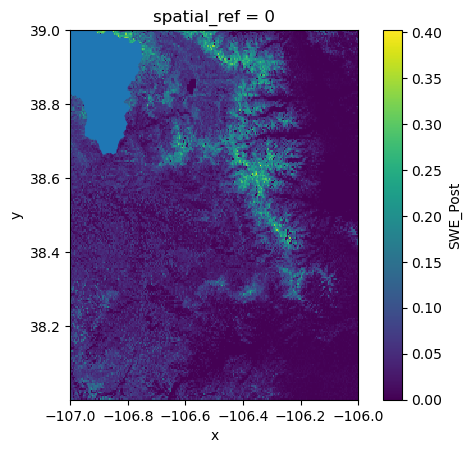

In [114]:
fig, ax = plt.subplots()
ds.plot(ax=ax)
aso_poly.to_crs('epsg:4326').plot(ax=ax)

In [110]:
matched = aso_er_orig.rio.reproject_match(ds_clip, resampling = rio.enums.Resampling.cubic)

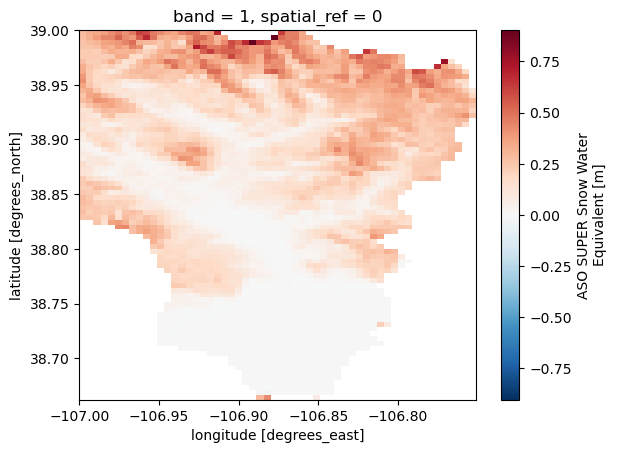

In [111]:
matched.plot()